#Detekcja znaku stop (na powierzchni jezdni i stojącego)
Detekcja za pomocą modelu detectron2

##Instalacja

In [1]:
#!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

##Uruchomienie modelu

Wczytanie wybranego obrazu

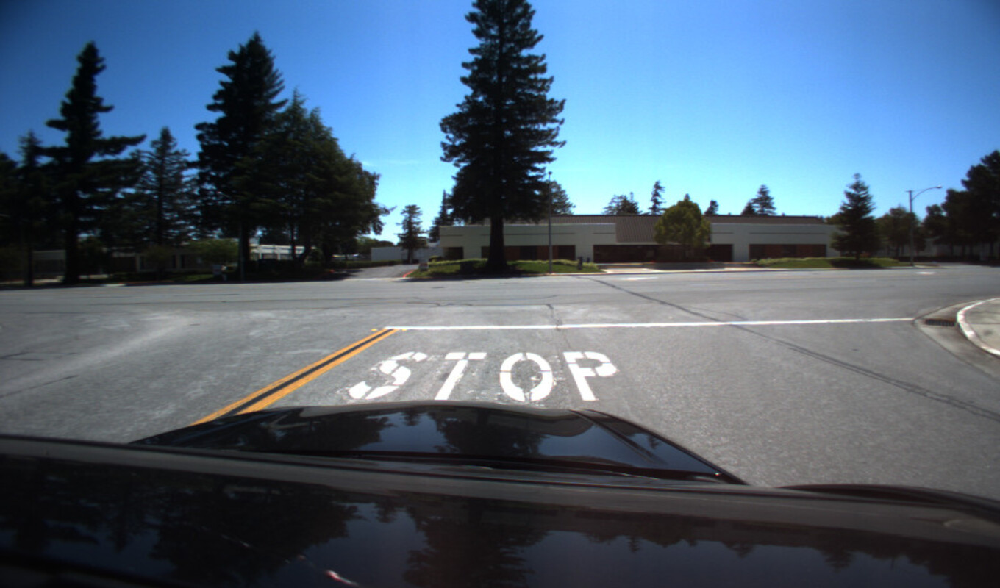

In [4]:
im = cv2.imread("/content/drive/MyDrive/Projekt_WK/images/image_train_gtsdb/00943.jpg")
cv2_imshow(im)

Utworzenie pliku config oraz `DefaultPredictor` w celu uruchomienia wnioskowania z informacji obrazowej

In [5]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
#cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

model_final_68b088.pkl: 421MB [00:10, 41.6MB/s]                           
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [6]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([2, 2], device='cuda:0')
Boxes(tensor([[   0.0000,  429.7326, 1335.8486,  784.0312],
        [ 403.6518,  534.7017, 1353.2144,  785.9566]], device='cuda:0'))


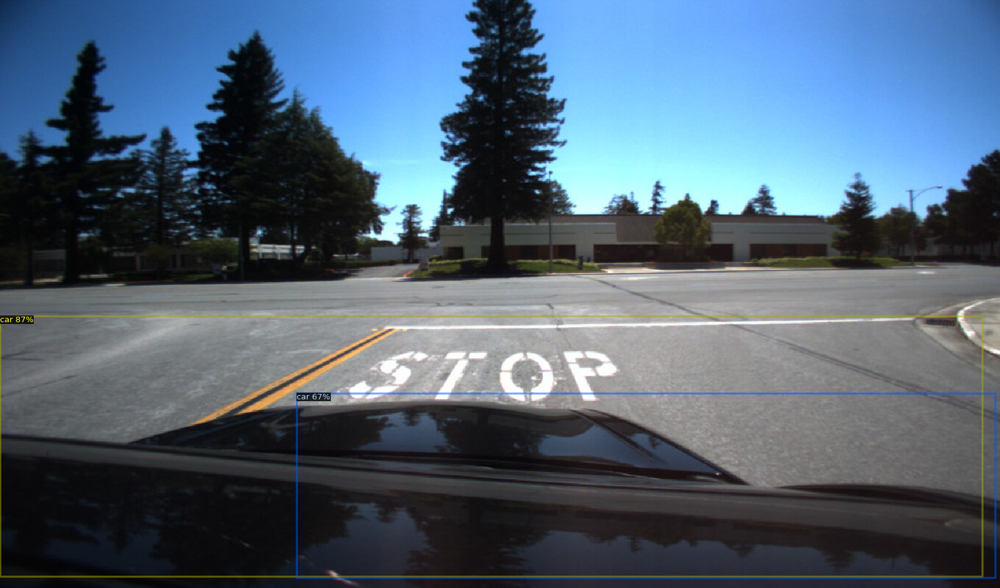

In [7]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

## Trening na własnej bazie danych

Została przygotowana autorska baza danych zawierająca obrazy z zaznaczonymi stojącymi znakami stop oraz znakami stop na powierzchni jezdni (wykorzystane narzędzie: Makesense.ai, https://www.makesense.ai/). Zbiór podzielony jest na testowy (ok. 40 obrazów) oraz treningowy (ok. 1200 obrazów) wraz z załączonymi odpowiadającymi im plikami  `json` z adnotacjami w formacie `COCO`

W poniższej komórce następuje rejestracja zbioru danych w systemie detectron2 oraz przekształcenie danych z pliku `json` do standardowego formatu dla detectronu2 w przypadku gdyby dane były w formacie niestandardowym

In [8]:
# if  dataset is in COCO format
from detectron2.data.datasets import register_coco_instances
register_coco_instances("tsd_train", {}, "/content/drive/MyDrive/Projekt_WK/train_set/annotations.json", "/content/drive/MyDrive/Projekt_WK/train_set")
register_coco_instances("tsd_test", {}, "/content/drive/MyDrive/Projekt_WK/test_set/annotations_2.json", "/content/drive/MyDrive/Projekt_WK/test_set")

from detectron2.structures import BoxMode

def get_tsd_dicts(img_dir, show_img=False):
    json_file = os.path.join(img_dir, "annotations.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns['images']):
        record = {}
        filename = os.path.join(img_dir, v["file_name"])
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        objs = []
        
        for _, anno in enumerate(imgs_anns['annotations']):
          if anno['image_id'] == v['id']:
            if show_img:
              category_id = int(anno['category_id']) - 1
            else:
              category_id = int(anno['category_id'])

            obj = {
                "bbox": anno["bbox"],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": anno["segmentation"],
                "category_id": category_id,
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

for d in ["train", "test"]:
  #DatasetCatalog.register("tsd_" + d + "3", lambda d=d: get_tsd_dicts("/content/drive/MyDrive/Projekt_WK/traffic_sign_detection_" + d))
  MetadataCatalog.get("tsd_" + d).set(thing_classes=["Stop_marking", "Stop_sign"])
tsd_metadata = MetadataCatalog.get("tsd_train")

W celu sprawdzenia poprwaności ładowania, zostały zwizualizowane adnotacje losowo wybranych obrazów ze zbioru treningowego

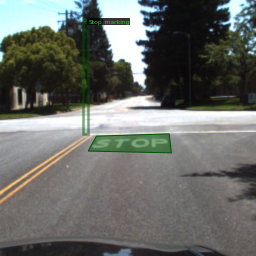

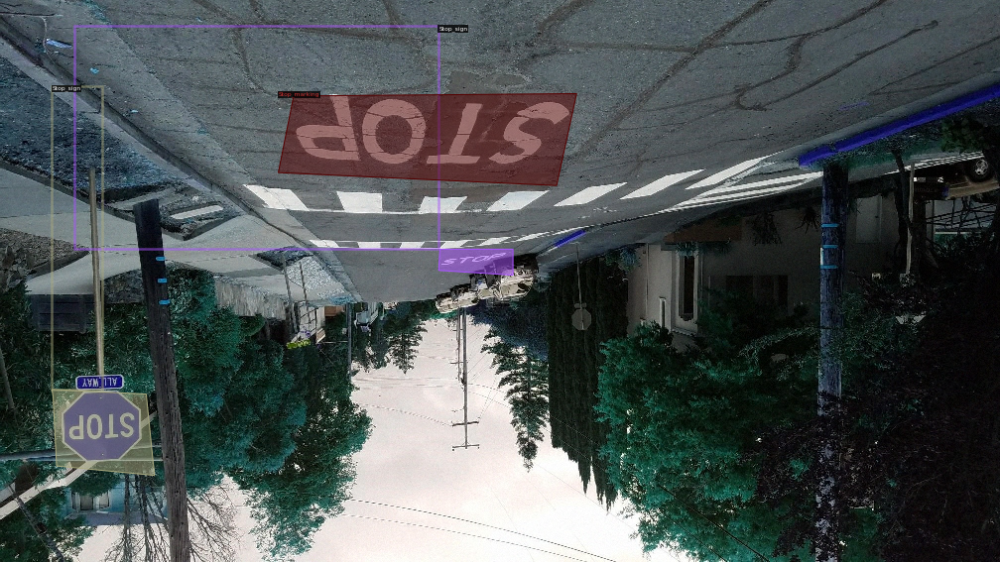

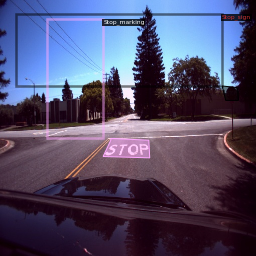

In [9]:
dataset_dicts = get_tsd_dicts("/content/drive/MyDrive/Projekt_WK/train_set", True)

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=tsd_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

##Uruchomienie treningu

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("tsd_train",)
cfg.DATASETS.TEST = ("tsd_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0005  # pick a good LR
cfg.SOLVER.MAX_ITER = 6000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[01/15 22:28:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[01/15 22:28:29 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[01/15 22:29:09 d2.utils.events]:  eta: 3:03:23  iter: 19  total_loss: 1.557  loss_cls: 1.029  loss_box_reg: 0.3563  loss_rpn_cls: 0.1686  loss_rpn_loc: 0.01939  time: 2.0116  data_time: 0.0171  lr: 9.9905e-06  max_mem: 6476M
[01/15 22:29:45 d2.utils.events]:  eta: 3:01:51  iter: 39  total_loss: 1.409  loss_cls: 0.8685  loss_box_reg: 0.4164  loss_rpn_cls: 0.1007  loss_rpn_loc: 0.01183  time: 1.8852  data_time: 0.0071  lr: 1.998e-05  max_mem: 6476M
[01/15 22:30:23 d2.utils.events]:  eta: 3:03:42  iter: 59  total_loss: 1.071  loss_cls: 0.6196  loss_box_reg: 0.4131  loss_rpn_cls: 0.1353  loss_rpn_loc: 0.009422  time: 1.8975  data_time: 0.0074  lr: 2.997e-05  max_mem: 6476M
[01/15 22:31:03 d2.utils.events]:  eta: 3:03:55  iter: 79  total_loss: 0.9645  loss_cls: 0.437  loss_box_reg: 0.4016  loss_rpn_cls: 0.09244  loss_rpn_loc: 0.01534  time: 1.9210  data_time: 0.0054  lr: 3.9961e-05  max_mem: 6541M
[01/15 22:31:46 d2.utils.events]:  eta: 3:04:38  iter: 99  total_loss: 1.001  loss_cls: 0.426

In [ ]:
#cfg.SOLVER.MAX_ITER = 6000
#resume_dir = '/content/output/last_checkpoint' # get  the last resume checkpoint file
#trainer_2 = DefaultTrainer(cfg)
#trainer_2.resume_or_load(resume_dir)
#trainer_2.train()

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

Pobranie wytrenowanego modelu

In [ ]:
#!zip -r /content/output.zip /content/output

  adding: content/output/ (stored 0%)
  adding: content/output/model_0004999.pth (deflated 7%)
  adding: content/output/last_checkpoint (stored 0%)
  adding: content/output/model_final.pth (deflated 7%)
  adding: content/output/events.out.tfevents.1642285707.65f3a034d196.280.0 (deflated 73%)
  adding: content/output/metrics.json (deflated 80%)


In [ ]:
#from google.colab import files
#files.download("/content/output.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##Ewaluacja wytrenowanego modelu

In [33]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("tsd_train",)
cfg.DATASETS.TEST = ("tsd_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0005  
cfg.SOLVER.MAX_ITER = 6000    
cfg.SOLVER.STEPS = []        
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  

In [34]:
# Inference should use the config with parameters that are used in training
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/Projekt_WK/output_1/model_final.pth"  # path to the model X101 
#cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/Projekt_WK/output_2/model_final.pth"  # path to the model R101 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Wizualizacja wyników predykcji dla losowo wybranych obrazów

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


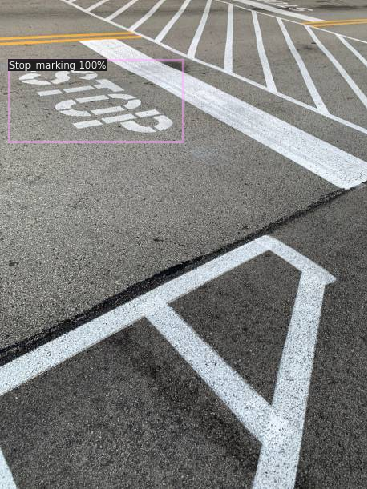

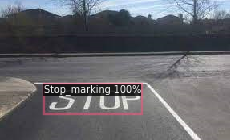

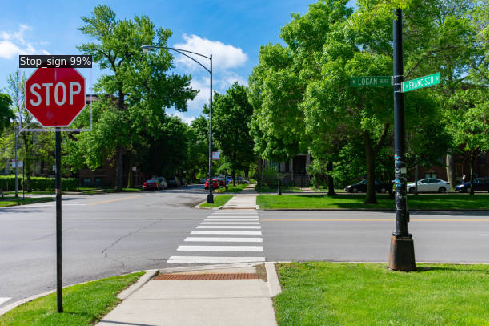

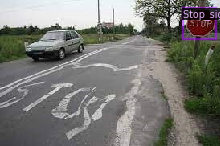

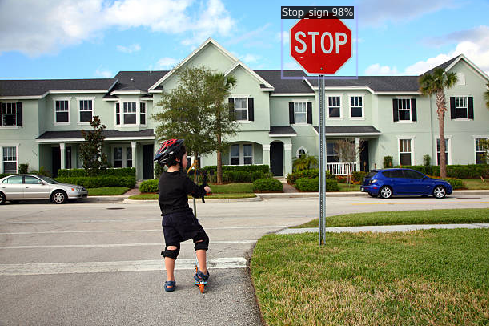

In [35]:
#register_coco_instances("tsd_val", {}, "annotations.json", "/content/drive/MyDrive/Projekt_WK/traffic_sign_detection_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_tsd_dicts("/content/drive/MyDrive/Projekt_WK/test_set")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=tsd_metadata, 
                   scale=0.8, 
                   #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    boxes = v._convert_boxes(outputs["instances"].pred_boxes.to('cpu'))
    for box in boxes:
      box = (round(box[0]), round(box[1]), round(box[2]) - round(box[0]), round(box[3] - box[1]))
    cv2_imshow(out.get_image()[:, :, ::-1])

Ocena wydajności za pomocą metryki AP zaimplementowanej w COCO API

In [36]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("tsd_test", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "tsd_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/17 01:40:39 d2.data.datasets.coco]: Loaded 23 images in COCO format from /content/drive/MyDrive/Projekt_WK/test_set/annotations_2.json
[01/17 01:40:39 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/17 01:40:39 d2.data.common]: Serializing 23 elements to byte tensors and concatenating them all ...
[01/17 01:40:39 d2.data.common]: Serialized dataset takes 0.01 MiB
[01/17 01:40:39 d2.evaluation.evaluator]: Start inference on 23 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[01/17 01:40:42 d2.evaluation.evaluator]: Inference done 11/23. Dataloading: 0.0015 s/iter. Inference: 0.2686 s/iter. Eval: 0.0002 s/iter. Total: 0.2703 s/iter. ETA=0:00:03
[01/17 01:40:46 d2.evaluation.evaluator]: Total inference time: 0:00:04.872497 (0.270694 s / iter per device, on 1 devices)
[01/17 01:40:46 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.265069 s / iter per device, on 1 devices)
[01/17 01:40:46 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[01/17 01:40:46 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[01/17 01:40:46 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[01/17 01:40:46 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[01/17 01:40:46 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[01/17 01:40:46 d2.evaluation.